# Magpylib for coils below PIC

Andrei Isichenko

Use `magpylib==5.2.1`

Note that collection.getB() returns TESLA and all distances are in meters in v5 


In [1]:
import numpy
import scipy
from scipy.spatial.transform import Rotation as R

import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import magpylib as magpy

from magpylib import SUPPORTED_PLOTTING_BACKENDS
magpy.defaults.display.backend = 'plotly'
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.io as pio
pio.renderers.default = 'notebook'

# convert T to G
T_to_G = 1e4
mm_to_m = 1e-3

## Helper functions

In [65]:
# ---- Helpers ----
# --- Centered coordinate helper ---
def B_along_centered(coil, p1, p2, C, n=600, to_gauss=True):
    """Compute B∥ along full beam, then shift s so that C→0."""
    p1 = np.asarray(p1, float)
    p2 = np.asarray(p2, float)
    C  = np.asarray(C,  float)

    # direction and arc-length along beam
    u = p2 - p1
    L = np.linalg.norm(u)
    u /= L
    s = np.linspace(0, L, n)            # m, from p1 to p2
    pts = p1[None, :] + s[:, None]*u[None, :]

    # Compute field and convert to Gauss
    B = magpy.getB(coil, pts)           # T
    if to_gauss:
        B *= T_to_G
    B_par = B @ u

    # Shift s so that intersection C is at 0
    sC = np.dot(C - p1, u)              # signed distance of C from p1
    s_centered = s - sC
    return s_centered, B_par


In [46]:
def plot_coil_and_beams_top_view(coil, beams_for_visualize):
    # --- Top view (XY) ---
    fig_top = plt.figure(figsize=(4,4))
    ax_top = fig_top.add_subplot(111)
    ax_top.set_title('Coil & beams (Top view, XY)')

    # ---- plot COIL geometry (recursively) ----
    stack = [coil]
    while stack:
        obj = stack.pop()
        # dive into collections
        if hasattr(obj, "children") and obj.children:
            stack.extend(list(obj.children))
            continue

        # get a polyline in local coords
        pts = None
        if hasattr(obj, "points"):                # Polyline (v5)
            pts = np.asarray(obj.points, float)
        elif hasattr(obj, "vertices"):            # Line
            pts = np.asarray(obj.vertices, float)
        elif hasattr(obj, "diameter"):            # Loop-like: synthesize circle
            R = float(obj.diameter)/2.0
            phi = np.linspace(0, 2*np.pi, 300)
            pts = np.column_stack([R*np.cos(phi), R*np.sin(phi), np.zeros_like(phi)])

        if pts is None:
            continue  # unknown geometry type; skip

        # apply orientation & position to world coords (meters)
        if hasattr(obj, "orientation") and hasattr(obj.orientation, "apply"):
            try:
                pts = obj.orientation.apply(pts)
            except Exception:
                pass
        if hasattr(obj, "position"):
            pts = pts + np.asarray(obj.position, float)

        # project to XY and plot in mm
        ax_top.plot(pts[:,0]/mm_to_m, pts[:,1]/mm_to_m,
                    color='royalblue', lw=0.7, alpha=0.7)

    # ---- plot BEAMS (red), projected to XY ----
    for beam in beams_for_visualize:
        # v5 Polyline uses .points; fallback to .vertices if needed
        if hasattr(beam, "points"):
            P = np.asarray(beam.points, float)
        else:
            P = np.asarray(beam.vertices, float)

        if hasattr(beam, "orientation") and hasattr(beam.orientation, "apply"):
            try:
                P = beam.orientation.apply(P)
            except Exception:
                pass
        if hasattr(beam, "position"):
            P = P + np.asarray(beam.position, float)

        ax_top.plot(P[:,0]/mm_to_m, P[:,1]/mm_to_m,
                    color='red', lw=3, alpha=0.9, zorder=10)

    # 13.5 mm reference circle
    circle_135 = plt.Circle((0, 0), 13.5, color='green', fill=False, lw=2, alpha=0.8)
    ax_top.add_patch(circle_135)

    ax_top.set_xlabel('X [mm]')
    ax_top.set_ylabel('Y [mm]')
    ax_top.set_aspect('equal', adjustable='box')
    ax_top.set_xlim([-50, 50])
    ax_top.set_ylim([-50, 50])
    plt.tight_layout()
    plt.show()

## Define laser beams

In [56]:
def build_beams():
    beams = magpy.Collection()

    beam_circ_radius = 13.5 * mm_to_m # m
    beams_diffrac_angle = 54 # deg. Diffraction angle of the beam. 
    z0 = beam_circ_radius * np.tan((90 - beams_diffrac_angle) * np.pi/180)
    print(f"z0 = {z0/mm_to_m:.1f} mm")

    # this is just for visualization, so set the current to 0. 

    beam1=magpy.current.Polyline(
        current=0,
        vertices=((0,-beam_circ_radius, 0),(0, beam_circ_radius, 2*z0)),
    )
    beams+= beam1

    offset_x = beam_circ_radius * np.cos(30 * np.pi/180)  # the beams are on the circle, separated 120 degrees apart.
    offset_y = beam_circ_radius * np.sin(30 * np.pi/180)
    
    beam2=magpy.current.Polyline(
        current=0,
        vertices=((offset_x, offset_y,0),(-offset_x,-offset_y, 2*z0)),
    )
    beams+= beam2

    beam3=magpy.current.Polyline(
        current=0,
        vertices=((-offset_x, offset_y,0),(offset_x,-offset_y, 2*z0)),
    )
    beams+= beam3
    beams_for_visualize = [beam1, beam2, beam3]

    return beams, beams_for_visualize, z0

def plot_Bfield_lines_per_beam_slice(coil, beams_for_visualize):
    def beam_world_poly(beam):
        if hasattr(beam, "points"): P = np.asarray(beam.points, float)
        else:                       P = np.asarray(beam.vertices, float)
        if hasattr(beam, "orientation") and hasattr(beam.orientation, "apply"):
            P = beam.orientation.apply(P)
        if hasattr(beam, "position"):
            P = P + np.asarray(beam.position, float)
        return P

    def plane_from_beam(beam):
        P = beam_world_poly(beam)
        t = P[-1] - P[0]; t /= np.linalg.norm(t)
        t_xy = np.array([t[0], t[1], 0.0])
        u = np.array([1.0, 0.0, 0.0]) if np.linalg.norm(t_xy) < 1e-12 else t_xy/np.linalg.norm(t_xy)
        z = np.array([0.0, 0.0, 1.0])
        Pmid = 0.5*(P[0] + P[-1])
        return Pmid, u, z, P

    # beams list
    beam_list = [beams_for_visualize[0], beams_for_visualize[1], beams_for_visualize[2]]

    # grid in plane coords (meters for getB; mm for plotting)
    U_span_mm, Z_span_mm = 60, 30
    Nu, Nz = 80, 50
    U_vals = np.linspace(-U_span_mm, U_span_mm, Nu) * mm_to_m
    Z_vals = np.linspace(-Z_span_mm, Z_span_mm, Nz) * mm_to_m
    U_grid, Z_grid = np.meshgrid(U_vals, Z_vals, indexing="xy")
    Umm, Zmm = U_grid/mm_to_m, Z_grid/mm_to_m

    # build all query points -> single getB (fast)
    plane_specs, all_pts = [], []
    for i, b in enumerate(beam_list, 1):
        Pmid, u_hat, z_hat, P = plane_from_beam(b)
        pts = (Pmid + U_grid[...,None]*u_hat + Z_grid[...,None]*z_hat).reshape(-1,3)
        plane_specs.append((Pmid, u_hat, z_hat, P, f"Beam {i} plane"))
        all_pts.append(pts)
    all_pts = np.vstack(all_pts)

    B_all_T = magpy.getB(coil, all_pts)
    B_all_G = B_all_T * T_to_G

    # ---------- figure (tight & consistent) ----------
    plt.rcParams.update({
        "font.size": 11,
        "axes.titlesize": 12,
        "figure.dpi": 160,
    })

    fig = plt.figure(constrained_layout=True, figsize=(12.8, 3.8))
    gs = fig.add_gridspec(1, 4, width_ratios=[1,1,1,0.045])
    axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
    cax  = fig.add_subplot(gs[0, 3])

    vmin, vmax = 0, 25
    norm = plt.Normalize(vmin, vmax)

    offset = 0
    for ax, (Pmid, u_hat, z_hat, P, title) in zip(axes, plane_specs):
        n = U_grid.size
        B = B_all_G[offset:offset+n].reshape(Z_grid.shape[0], Z_grid.shape[1], 3)
        offset += n

        Bu = B[...,0]*u_hat[0] + B[...,1]*u_hat[1] + B[...,2]*u_hat[2]
        Bz = B[...,2]
        Bmag = np.hypot(Bu, Bz)

        # streamlined, readable streamplot
        sp = ax.streamplot(
            Umm, Zmm, Bu, Bz,
            color=Bmag, cmap="RdYlBu_r", norm=norm,
            density=1.6, linewidth=1.05, arrowsize=0.8,
        )

        # all beams overlaid in red (no labels)
        for b in beam_list:
            Pk = beam_world_poly(b)
            U_beam = (Pk - Pmid) @ u_hat / mm_to_m
            Z_beam = (Pk - Pmid) @ z_hat / mm_to_m
            ax.plot(U_beam, Z_beam, color="red", lw=2, alpha=0.9, zorder=10)

        ax.set_title(title)
        ax.set_xlabel("projXY(Beam̂) [mm]")
        ax.set_aspect("equal", adjustable="box")
        ax.margins(x=0.02, y=0.02)  # trim whitespace

    axes[0].set_ylabel("Z [mm]")
    for a in axes[1:]:
        a.tick_params(labelleft=False)  # cleaner, shared Y

    # single shared colorbar
    mappable = axes[0].collections[0]  # from streamplot
    cb = fig.colorbar(mappable, cax=cax)
    cb.set_label("B [G]")
    cb.set_ticks([0,5,10,15,20,25])

    plt.show()

In [47]:
### beams
beams, beams_for_visualize, z0 = build_beams()

fig = magpy.show(beams, backend="plotly", return_fig=True)
fig.update_layout(width=700, height=600)
fig.show()

z0 = 9.8 mm


#### Check beam orthogonality

The measured beam angle is 54 deg, not the perfect orthogonal 54.7 deg.

In [48]:
# Calculate direction vectors using beams_for_visualize
beam_dirs = []
for beam in beams_for_visualize:
    verts = np.array(beam.vertices)
    direction = verts[1] - verts[0]
    direction_norm = direction / np.linalg.norm(direction)
    beam_dirs.append(direction_norm)

# Dot products (should be ~0 if orthogonal)
dot12 = np.dot(beam_dirs[0], beam_dirs[1])
dot23 = np.dot(beam_dirs[1], beam_dirs[2])
dot31 = np.dot(beam_dirs[2], beam_dirs[0])

print(f"Dot product beam1·beam2: {dot12:.2f}")
print(f"Dot product beam2·beam3: {dot23:.2f}")
print(f"Dot product beam3·beam1: {dot31:.2f}")

Dot product beam1·beam2: 0.02
Dot product beam2·beam3: 0.02
Dot product beam3·beam1: 0.02


### Concentric coil PCB. Two coils in one layer.

In [57]:
def build_Nitin_V3_coil(inner_current = 1, outer_current = -1):

    coil = magpy.Collection()

    N1 = 52 #Number of Inner Turns   #38
    N2 = 40 #Number of Outer Turns   #30

    Rin1 = 2 * mm_to_m
    Rin2 = 23 * mm_to_m
    Rout1 = 25.4 * mm_to_m
    Rout2 = 44.4 * mm_to_m # Outermost radius of loops in mm so board will be around 10cm wide

    R1 = (Rin2-Rin1)/(2*N1)
    R2 = (Rout2-Rout1)/(2*N2)

    radii_inner = np.linspace(Rin1,Rin2,N1)
    radii_outer = np.linspace(Rout1,Rout2,N2)

    # Loop 1 inner
    for r in radii_inner:
        winding = magpy.current.Loop(
            current = inner_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,0))
        coil += winding


    # Loop 1 outer
    for r in radii_outer:
        winding = magpy.current.Loop(
            current = outer_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,0))
        coil += winding

    # Loop 2 inner
    for r in radii_inner:
        winding = magpy.current.Loop(
            current = inner_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,-0.1344*mm_to_m))
        coil += winding


    # Loop 2 outer
    for r in radii_outer:
        winding = magpy.current.Loop(
            current = outer_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,-0.1344*mm_to_m))
        coil += winding

    # Loop 3 inner
    for r in radii_inner:
        winding = magpy.current.Loop(
            current = inner_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,-0.6996*mm_to_m))
        coil += winding
        
    # Loop 3 outer
    for r in radii_outer:
        winding = magpy.current.Loop(
            current = outer_current,
            diameter = 2*r,
            position = (0,0,-0.6996 * mm_to_m))
        coil += winding


    # Loop 4 inner
    for r in radii_inner:
        winding = magpy.current.Loop(
            current = inner_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,-0.8236 * mm_to_m))
        coil += winding
        
    # Loop 4 outer 
    for r in radii_outer:
        winding = magpy.current.Loop(
            current = outer_current,
            diameter = 2*r,
            position = (0,0,-0.8236 * mm_to_m))
        coil += winding

    # Loop 5 inner
    for r in radii_inner:
        winding = magpy.current.Loop(
            current = inner_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,-1.3888 * mm_to_m))
        coil += winding
        
    # Loop 5 outer
    for r in radii_outer:
        winding = magpy.current.Loop(
            current = outer_current,
            diameter = 2*r,
            position = (0,0,-1.3888 * mm_to_m))
        coil += winding

    # Loop 6 inner
    for r in radii_inner:
        winding = magpy.current.Loop(
            current = inner_current, #good at 1.5 for single layer
            diameter = 2*r,
            position = (0,0,-1.5034 * mm_to_m))
        coil += winding
        
    # Loop 6 outer
    for r in radii_outer:
        winding = magpy.current.Loop(
            current = outer_current,
            diameter = 2*r,
            position = (0,0,-1.5034 * mm_to_m))
        coil += winding

    return coil

z0 = 9.8 mm


/Users/andrei/miniconda3/envs/magpylibv5_env/lib/python3.13/site-packages/magpylib/_src/obj_classes/class_current_Circle.py:131: MagpylibDeprecationWarning:

Loop is deprecated  and will be removed in a future version, use Circle instead.



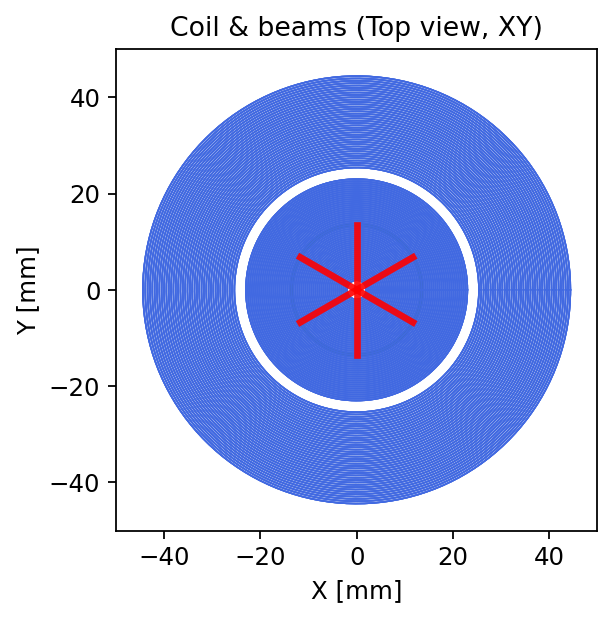

In [58]:
### beams
beams, beams_for_visualize, z0 = build_beams()

#### coils
# create a Magpylib collection of Loop Sources that form a coil
coil = build_Nitin_V3_coil()

fig = magpy.show([coil, beams], backend="plotly", return_fig=True)
fig.update_layout(width=700, height=600)
fig.show()

plot_coil_and_beams_top_view(coil, beams_for_visualize)

/Users/andrei/miniconda3/envs/magpylibv5_env/lib/python3.13/site-packages/magpylib/_src/obj_classes/class_current_Circle.py:127: MagpylibDeprecationWarning:

Loop is deprecated  and will be removed in a future version, use Circle instead.



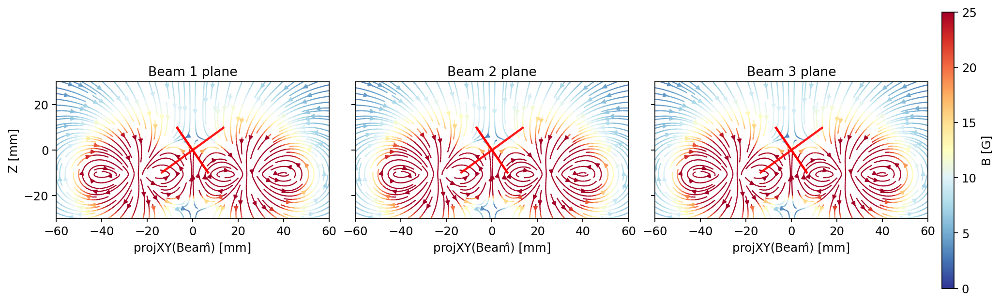

In [59]:
plot_Bfield_lines_per_beam_slice(coil, beams_for_visualize)

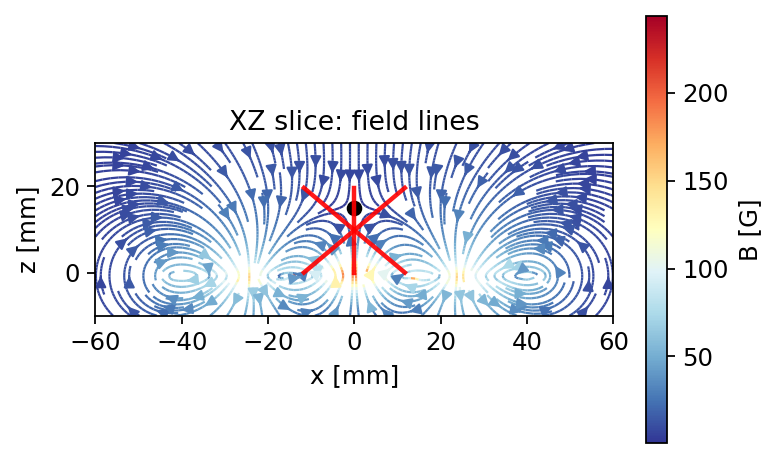

In [60]:
# The following cell creates a 2D field slice visualization as before
# --- 2D Figure: Field lines ---
fig2 = plt.figure(figsize=(5,3))
ax2 = fig2.add_subplot(111)  # 2D-axis

# create a grid
xvals = np.linspace(-60,60,100) * mm_to_m
yvals = np.linspace(-60,60,100) * mm_to_m
zvals = np.linspace(-10,30,100) * mm_to_m
grid_XZ_slice = np.array([[(x,0,z) for x in xvals] for z in zvals])
grid_3d = np.array([[[(x,y,z) for x in xvals] for y in yvals] for z in zvals])

# compute field on grid
B_xz = magpy.getB(coil, grid_XZ_slice) # in T
B_xz = B_xz * T_to_G

strm = ax2.streamplot(
    grid_XZ_slice[:,:,0]/mm_to_m, grid_XZ_slice[:,:,2]/mm_to_m, B_xz[:,:,0], B_xz[:,:,2],
    color=np.hypot(B_xz[:,:,0], B_xz[:,:,2]),
    density=2, linewidth=1, cmap='RdYlBu_r'
)

cbar = fig2.colorbar(strm.lines, ax=ax2, label="|B| (G)")
ax2.scatter(0,15, color='black', zorder=5)
# Draw the beams, projected into this (x,z) axis (ignore y)
for beam in beams_for_visualize:
    verts = np.array(beam.vertices)
    ax2.plot(verts[:,0]/mm_to_m, verts[:,2]/mm_to_m, color='red', lw=2, alpha=0.9, zorder=10)
cbar.set_label("B [G]")
ax2.set_title('XZ slice: field lines')
ax2.set_ylabel('z [mm]')
ax2.set_xlabel('x [mm]')
ax2.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

## Concentric PCB + tilt PCB

z0 = 9.8 mm


/Users/andrei/miniconda3/envs/magpylibv5_env/lib/python3.13/site-packages/magpylib/_src/obj_classes/class_current_Circle.py:131: MagpylibDeprecationWarning:

Loop is deprecated  and will be removed in a future version, use Circle instead.



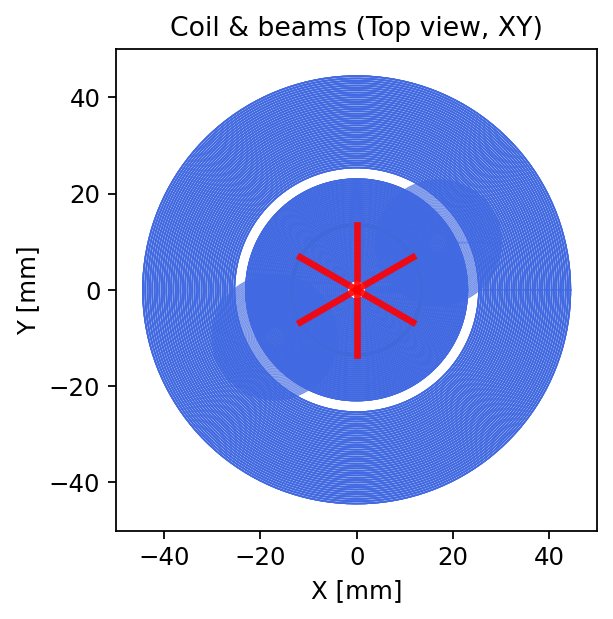

In [61]:
# --- 3D Figure: Coil geometry ---
# Create an interactive 3D plot window
from mpl_toolkits.mplot3d import Axes3D  # Not always necessary, but good for explicitness

# build beams
beams, beams_for_visualize, z0 = build_beams()

# create a Magpylib collection of Loop Sources that form a coil
coil = build_Nitin_V3_coil(inner_current=0.9, outer_current=-1.0)

# tilt PCB
# Lower right coil stack

current = 2
z_loc = -3 * mm_to_m

R_inner = 2 * mm_to_m
R_outer = 13 * mm_to_m
N_turns = 35
radii = np.linspace(R_inner, R_outer, N_turns)

offset_x = 2*z0 * np.cos(30 * np.pi/180)
offset_y = 2*z0 * np.sin(30 * np.pi/180)
for r in radii:
    winding = magpy.current.Loop(
        current=current,  # counter-clockwise
        diameter=2*r,
        position=(offset_x, offset_y, z_loc)
    )
    coil += winding

# Lower left coil stack
for r in radii:
    winding = magpy.current.Loop(
        current=-current,  # clockwise
        diameter=2*r,
        position=(-offset_x, -offset_y, z_loc)
    )
    coil += winding

###########################

fig = magpy.show([coil, beams], backend="plotly", return_fig=True)
fig.update_layout(width=700, height=600)
fig.show()

# 2D visualization

plot_coil_and_beams_top_view(coil, beams_for_visualize)

/Users/andrei/miniconda3/envs/magpylibv5_env/lib/python3.13/site-packages/magpylib/_src/obj_classes/class_current_Circle.py:127: MagpylibDeprecationWarning:

Loop is deprecated  and will be removed in a future version, use Circle instead.



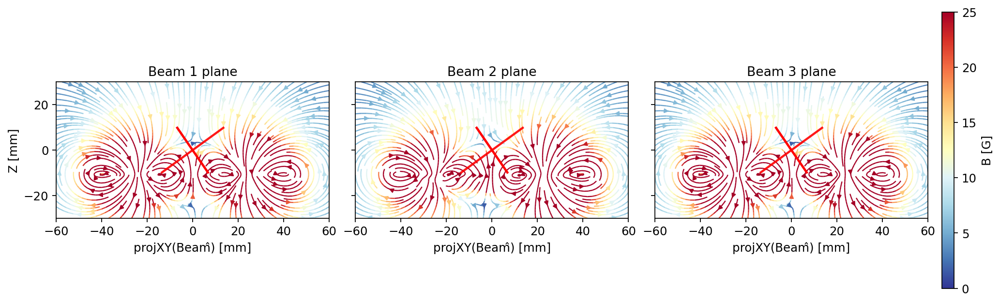

In [62]:
plot_Bfield_lines_per_beam_slice(coil, beams_for_visualize)

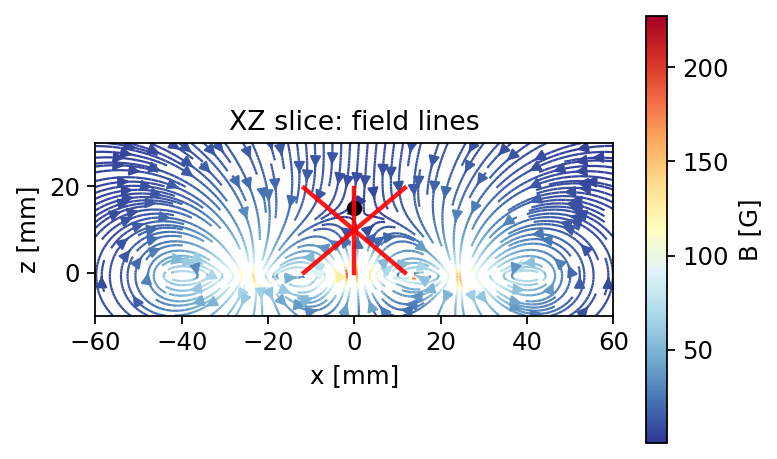

In [63]:
# The following cell creates a 2D field slice visualization as before
# --- 2D Figure: Field lines ---
fig2 = plt.figure(figsize=(5,3))
ax2 = fig2.add_subplot(111)  # 2D-axis

# create a grid
xvals = np.linspace(-60,60,100) * mm_to_m
yvals = np.linspace(-60,60,100) * mm_to_m
zvals = np.linspace(-10,30,100) * mm_to_m
grid_XZ_slice = np.array([[(x,0,z) for x in xvals] for z in zvals])
grid_3d = np.array([[[(x,y,z) for x in xvals] for y in yvals] for z in zvals])

# compute field on grid
B_xz = magpy.getB(coil, grid_XZ_slice) # in T
B_xz = B_xz * T_to_G

strm = ax2.streamplot(
    grid_XZ_slice[:,:,0]/mm_to_m, grid_XZ_slice[:,:,2]/mm_to_m, B_xz[:,:,0], B_xz[:,:,2],
    color=np.hypot(B_xz[:,:,0], B_xz[:,:,2]),
    density=2, linewidth=1, cmap='RdYlBu_r'
)

cbar = fig2.colorbar(strm.lines, ax=ax2, label="|B| (G)")
ax2.scatter(0,15, color='black', zorder=5)
# Draw the beams, projected into this (x,z) axis (ignore y)
for beam in beams_for_visualize:
    verts = np.array(beam.vertices)
    ax2.plot(verts[:,0]/mm_to_m, verts[:,2]/mm_to_m, color='red', lw=2, alpha=0.9, zorder=10)
cbar.set_label("B [G]")
ax2.set_title('XZ slice: field lines')
ax2.set_ylabel('z [mm]')
ax2.set_xlabel('x [mm]')
ax2.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

## Bfield along beam

Samples each beam (its two vertices) with 600 points


Computes $\mathbf{B}(\mathbf{r})$ at those points (Magpylib returns mT → converted to G).

Projects onto the beam direction $\hat{\mathbf{u}} = \frac{\mathbf{p}_2-\mathbf{p}_1}{\|\mathbf{p}_2-\mathbf{p}1\|}$

$B\parallel(s) = \mathbf{B}(s)\cdot\hat{\mathbf{u}}$

/Users/andrei/miniconda3/envs/magpylibv5_env/lib/python3.13/site-packages/magpylib/_src/obj_classes/class_current_Circle.py:127: MagpylibDeprecationWarning:

Loop is deprecated  and will be removed in a future version, use Circle instead.



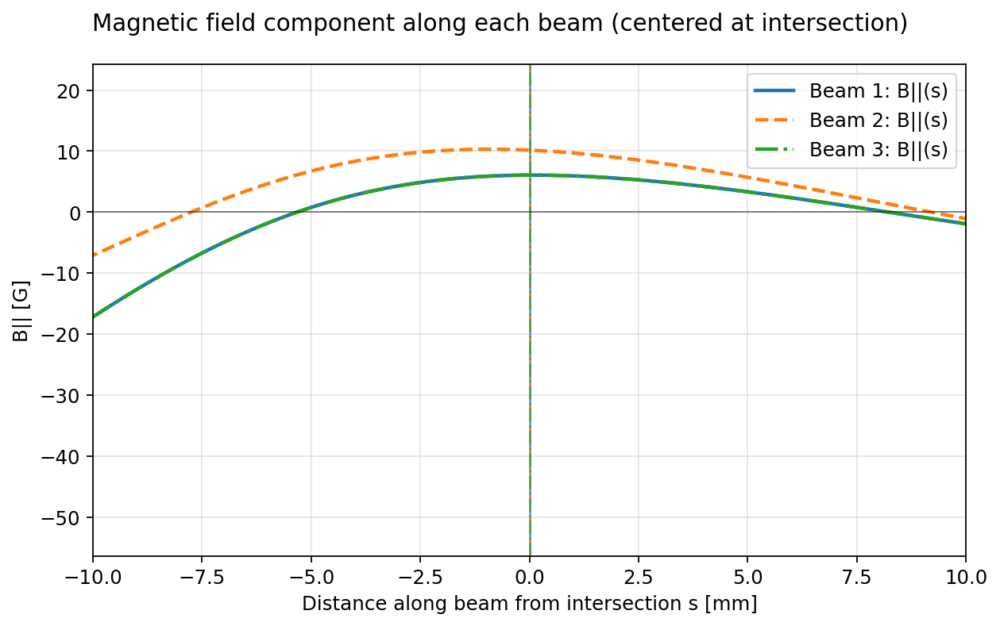

In [87]:
# ---- Gather beam endpoints from your 'beams' collection ----
beam_endpoints = []
for b in beams_for_visualize:
    # Each is a magpylib.current.Line with two vertices
    v = np.array(b.vertices, dtype=float)
    if v.shape != (2, 3):
        raise ValueError("Expected line with 2 vertices")
    beam_endpoints.append((tuple(v[0]), tuple(v[1])))

# --- Plot B∥(s) with intersection at s=0 ---
C = np.array([0.0, 0.0, z0], float)

fig, ax = plt.subplots(figsize=(8,5))

# Define a cycle of linestyles to make overlapping lines easier to distinguish
from itertools import cycle

linestyles = cycle(['-', '--', '-.', ':'])

for i, (p1, p2) in enumerate(beam_endpoints, start=1):
    s_m, B_par_G = B_along_centered(coil, p1, p2, C, n=600, to_gauss=True)
    ls = next(linestyles)
    ax.plot(s_m/mm_to_m, B_par_G, lw=2, ls=ls, label=f"Beam {i}: B||(s)")
    color = ax.lines[-1].get_color()
    ax.axvline(0, color=color, ls=ls, lw=1.2, alpha=0.7)  # intersection marker

ax.axhline(0, color='k', lw=0.8, alpha=0.5)
ax.set_xlabel("Distance along beam from intersection s [mm]")
ax.set_ylabel("B|| [G]")
ax.set_xlim(-10, 10)   # window around intersection
#ax.set_ylim(-10, 10)   # window around intersection
ax.grid(True, alpha=0.3)
ax.legend(loc="best")
fig.suptitle("Magnetic field component along each beam (centered at intersection)")
plt.tight_layout()
plt.show()

## Two layers overlapped coils

z0 = 9.8 mm


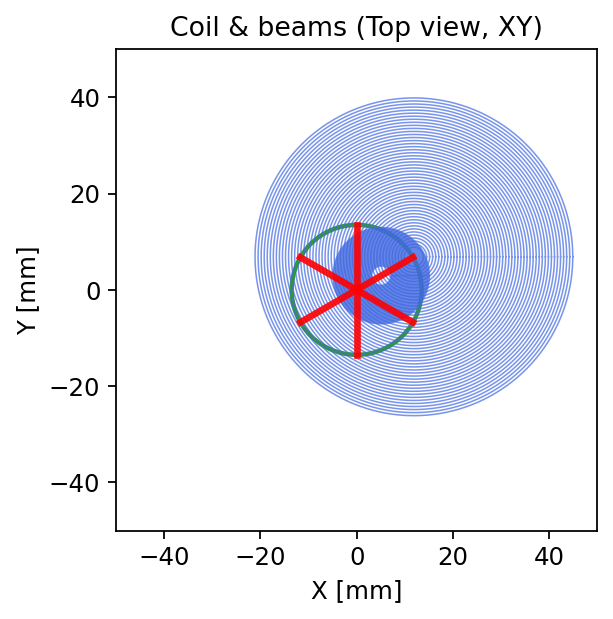

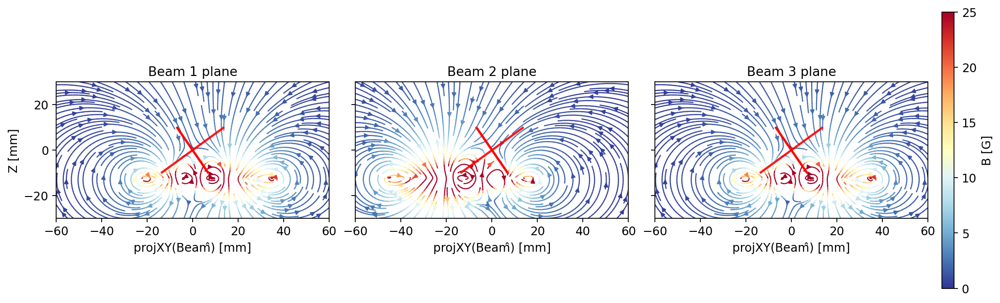

In [245]:
# --- 3D Figure: Coil geometry ---
# Create an interactive 3D plot window
from mpl_toolkits.mplot3d import Axes3D  # Not always necessary, but good for explicitness

# build beams
beams, beams_for_visualize, z0 = build_beams()

coil = magpy.Collection()

# tilt PCB
# Lower right coil stack

current = 4

# z_top = -5 * mm_to_m
# z_bot = -6 * mm_to_m

z_top = -2 * mm_to_m
z_bot = -3 * mm_to_m



R_inner = 2 * mm_to_m
R_outer = 10 * mm_to_m
N_turns = 40
radii = np.linspace(R_inner, R_outer, N_turns)

offset_x = 0.6 * z0 * np.cos(30 * np.pi/180) 
offset_y = 0.6 * z0 * np.sin(30 * np.pi/180) 
for r in radii:
    winding = magpy.current.Loop(
        current=current,  # counter-clockwise
        diameter=2*r,
        position=(offset_x, offset_y, z_top)
    )
    coil += winding

# Lower left coil stack

current = 2

R_inner = 2 * mm_to_m
R_outer = 33 * mm_to_m
N_turns = 50
radii = np.linspace(R_inner, R_outer, N_turns)
offset_x = -1.4*z0 * np.cos(30 * np.pi/180) 
offset_y = -1.4*z0 * np.sin(30 * np.pi/180) 
for r in radii:
    winding = magpy.current.Loop(
        current=-current,  # clockwise
        diameter=2*r,
        position=(-offset_x, -offset_y, z_bot)
    )
    coil += winding

###########################

fig = magpy.show([coil, beams], backend="plotly", return_fig=True)
fig.update_layout(width=700, height=600)
fig.show()

# 2D visualization

plot_coil_and_beams_top_view(coil, beams_for_visualize)

plot_Bfield_lines_per_beam_slice(coil, beams_for_visualize)

Beam 1: Slope dB||/ds at s=0: 4.0 G/cm
Beam 2: Slope dB||/ds at s=0: -8.7 G/cm
Beam 3: Slope dB||/ds at s=0: 4.1 G/cm


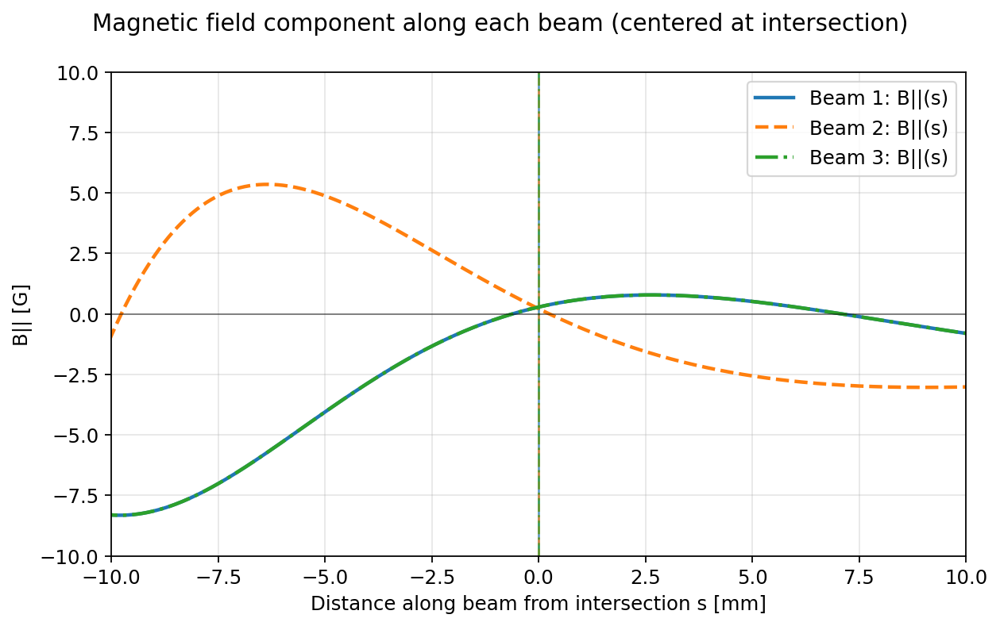

In [246]:
# ---- Gather beam endpoints from your 'beams' collection ----
beam_endpoints = []
for b in beams_for_visualize:
    # Each is a magpylib.current.Line with two vertices
    v = np.array(b.vertices, dtype=float)
    if v.shape != (2, 3):
        raise ValueError("Expected line with 2 vertices")
    beam_endpoints.append((tuple(v[0]), tuple(v[1])))

# --- Plot B∥(s) with intersection at s=0 ---
C = np.array([0.0, 0.0, z0], float)

fig, ax = plt.subplots(figsize=(8,5))

# Define a cycle of linestyles to make overlapping lines easier to distinguish
from itertools import cycle

linestyles = cycle(['-', '--', '-.', ':'])

for i, (p1, p2) in enumerate(beam_endpoints, start=1):
    s_m, B_par_G = B_along_centered(coil, p1, p2, C, n=600, to_gauss=True)
    ls = next(linestyles)
    ax.plot(s_m/mm_to_m, B_par_G, lw=2, ls=ls, label=f"Beam {i}: B||(s)")
    color = ax.lines[-1].get_color()
    ax.axvline(0, color=color, ls=ls, lw=1.2, alpha=0.7)  # intersection marker

    # Calculate the slope (dB/ds) at s=0 by finite difference
    # s_m is centered at 0 (since s=0 is the beam intersection)
    idx0 = np.argmin(np.abs(s_m))  # nearest index where s≈0
    if idx0 == 0:
        # if by coincidence s=0 is the very first point (rare), use forward diff
        ds = s_m[1]-s_m[0]
        dB = B_par_G[1]-B_par_G[0]
    elif idx0 == len(s_m)-1:
        # if last, use backward diff
        ds = s_m[-1]-s_m[-2]
        dB = B_par_G[-1]-B_par_G[-2]
    else:
        # central difference
        ds = s_m[idx0+1]-s_m[idx0-1]
        dB = B_par_G[idx0+1]-B_par_G[idx0-1]
    slope_G_per_cm = dB/ds * 0.01  # slopes in G per cm
    print(f"Beam {i}: Slope dB||/ds at s=0: {slope_G_per_cm:.1f} G/cm")

ax.axhline(0, color='k', lw=0.8, alpha=0.5)
ax.set_xlabel("Distance along beam from intersection s [mm]")
ax.set_ylabel("B|| [G]")
ax.set_xlim(-10, 10)   # window around intersection
ax.set_ylim(-10, 10)   # window around intersection
ax.grid(True, alpha=0.3)
ax.legend(loc="best")
fig.suptitle("Magnetic field component along each beam (centered at intersection)")
plt.tight_layout()
plt.show()

# Point dipole approach

Assume they can be on separate z-levels, i.e. two different PCBs

m1: [ 0.00000000e+00 -8.68891879e-11  3.57851265e-10],  m2: [-1.24539832e+01  8.68891879e-11 -3.57851266e-10],  a(mm): 2.252,  dz(mm): 1.099


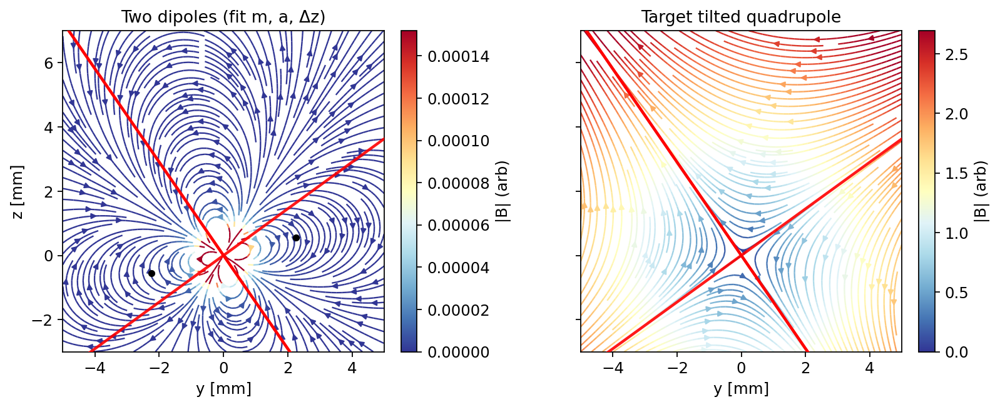

In [99]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import least_squares

# --- constants you already use ---
mm_to_m = 1e-3
scale   = 1e7   # numerical scale so dipole fields aren't tiny vs target

# ---- dipole field (arbitrary units) ----
def dipole_B(r, r0, m, eps=1e-12):
    R  = r - r0
    R2 = np.sum(R*R, axis=-1) + eps
    Rn = np.sqrt(R2)
    Rhat = R / Rn[..., None]
    R3 = R2 * Rn
    return (3.0*np.sum(Rhat*m, axis=-1)[...,None]*Rhat - m) / R3[...,None]

# ---- target tilted quadrupole in YZ ----
def target_field_yz(y, z, G=0.35, theta_deg=-54.0):
    th = np.deg2rad(theta_deg); c, s = np.cos(th), np.sin(th)
    Q = np.array([[c*c - s*s, 2*c*s],[2*c*s, s*s - c*c]])
    YZ = np.stack([y, z], axis=0).reshape(2, -1)
    B  = (G * (Q @ YZ)).reshape(2, *y.shape)
    return B[0], B[1]  # By, Bz

# ---- sample region near the center (emphasize the ROI) ----
Ny, Nz = 31, 31
y = np.linspace(-2.5, 2.5, Ny)
z = np.linspace(-2.5, 2.5, Nz)
Y, Z = np.meshgrid(y, z, indexing='xy')
r = np.stack([np.zeros_like(Y), Y, Z], axis=-1).reshape(-1,3)

By_t, Bz_t = target_field_yz(Y, Z, G=1.0, theta_deg=-54.0)
b = np.concatenate([By_t.ravel(), Bz_t.ravel()])

# Optional: center-weighting (helps match tilt right at the origin)
rho2 = (Y**2 + Z**2).ravel()
w = 1.0/(1.0 + (rho2/2.0))      # heavier weight near center
W = np.concatenate([w, w])      # for By and Bz

# ---- fit settings ----
max_dz_mm = 6.0                   # <-- your constraint
USE_ANTISYM = False                # set False to allow independent m1,m2

# ----- residual for least_squares -----
def residual(vars):
    if USE_ANTISYM:
        m1 = vars[0:3]
        a  = vars[3]
        dz = vars[4]
        m2 = -m1
    else:
        m1 = vars[0:3]
        m2 = vars[3:6]
        a  = vars[6]
        dz = vars[7]

    r1 = np.array([0.0, +a, +0.5*dz])
    r2 = np.array([0.0, -a, -0.5*dz])

    B1 = scale * dipole_B(r, r1, m1)
    B2 = scale * dipole_B(r, r2, m2)
    By = B1[:,1] + B2[:,1]
    Bz = B1[:,2] + B2[:,2]
    model = np.concatenate([By, Bz])

    # weighted residual (focus fit near the center)
    return W*(model - b)

# ----- initial guess & bounds -----
if USE_ANTISYM:
    # start with a moment tilted in y–z, opposite pair
    x0 = np.array([0.0, 0.8, 1.0,   # m1x,m1y,m1z
                   2.0,             # a (mm units converted below in bounds)
                   1.0])            # dz (mm)
    # bounds: m free, a>0.5mm..6mm, dz within ±max_dz
    lb = np.array([-np.inf, -np.inf, -np.inf, 0.5, -max_dz_mm])
    ub = np.array([ np.inf,  np.inf,  np.inf, 6.0,  max_dz_mm])
else:
    x0 = np.array([0.0, 0.8, 1.0,   0.0, -0.8, -1.0,   2.0, 1.0])
    lb = np.array([-np.inf]*6 + [0.5, -max_dz_mm])
    ub = np.array([ np.inf]*6 + [6.0,  max_dz_mm])

# convert a,dz guesses & bounds from mm to meters inside the solver wrapper
def wrap_residual(raw_vars):
    v = raw_vars.copy()
    if USE_ANTISYM:
        v[3] *= mm_to_m
        v[4] *= mm_to_m
    else:
        v[6] *= mm_to_m
        v[7] *= mm_to_m
    return residual(v)

res = least_squares(
    wrap_residual, x0,
    bounds=(lb, ub),
    xtol=1e-10, ftol=1e-10, gtol=1e-10, max_nfev=400
)

# unpack (convert a,dz to meters for plotting/eval)
v = res.x.copy()
if USE_ANTISYM:
    m1 = v[0:3]; m2 = -m1; a = v[3]*mm_to_m; dz = v[4]*mm_to_m
else:
    m1 = v[0:3]; m2 = v[3:6]; a = v[6]*mm_to_m; dz = v[7]*mm_to_m

print(f"m1: {m1},  m2: {m2},  a(mm): {a/mm_to_m:.3f},  dz(mm): {dz/mm_to_m:.3f}")

# ---- visualize on a denser grid ----
# ---- visualize on a denser grid ----
yy = np.linspace(-5, 5, 201); zz = np.linspace(-3, 7, 201)
YY, ZZ = np.meshgrid(yy, zz, indexing='xy')
r_disp = np.stack([np.zeros_like(YY), YY, ZZ], axis=-1)

r1 = np.array([0.0, +a, +0.5*dz]); r2 = np.array([0.0, -a, -0.5*dz])
B1 = scale * dipole_B(r_disp, r1, m1)
B2 = scale * dipole_B(r_disp, r2, m2)
By = B1[...,1] + B2[...,1]
Bz = B1[...,2] + B2[...,2]
Bmag = np.hypot(By,Bz)

ByT, BzT = target_field_yz(YY, ZZ, G=0.35, theta_deg=-54.0)
BmagT = np.hypot(ByT, BzT)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10.6, 4.2), sharey=True)
n1 = plt.Normalize(0, np.percentile(Bmag, 98))
sp1 = ax1.streamplot(yy, zz, By, Bz, color=Bmag, cmap='RdYlBu_r',
                     norm=n1, density=2.0, linewidth=1.05, arrowsize=0.8)
fig.colorbar(sp1.lines, ax=ax1, fraction=0.046, pad=0.04).set_label("|B| (arb)")
ax1.plot([+a/mm_to_m,-a/mm_to_m], [dz/(2*mm_to_m), -dz/(2*mm_to_m)], 'ko', ms=4)
ax1.set_title("Two dipoles (fit m, a, Δz)")
ax1.set_xlabel("y [mm]"); ax1.set_ylabel("z [mm]")
ax1.set_aspect('equal')

# === overlay all beams (no labels, red) ===
# beam_list = beams_for_visualize or similar
# beam_world_poly(b) should return Nx3 world coordinates (m)
# Pmid, u_hat, z_hat are the same definitions as in your beam-plane plotting code
for b in beam_list:
    Pk = beam_world_poly(b)
    U_beam = (Pk - Pmid) @ u_hat / mm_to_m
    Z_beam = (Pk - Pmid) @ z_hat / mm_to_m
    for ax in (ax1, ax2):
        ax.plot(U_beam, Z_beam, color="red", lw=2, alpha=0.9, zorder=10)
        ax.scatter(U_beam, Z_beam, color="red", s=10, alpha=0.8, zorder=11)

# ---- target plot ----
n2 = plt.Normalize(0, np.percentile(BmagT, 98))
sp2 = ax2.streamplot(yy, zz, ByT, BzT, color=BmagT, cmap='RdYlBu_r',
                     norm=n2, density=2.0, linewidth=1.05, arrowsize=0.8)
fig.colorbar(sp2.lines, ax=ax2, fraction=0.046, pad=0.04).set_label("|B| (arb)")
ax2.set_title("Target tilted quadrupole")
ax2.set_xlabel("y [mm]")
ax2.set_aspect('equal')

ax1.set_xlim(yy[0], yy[-1])
ax1.set_ylim(zz[0], zz[-1])
ax2.set_xlim(yy[0], yy[-1])
ax2.set_ylim(zz[0], zz[-1])

plt.tight_layout()
plt.show()

Top PCB moments:  m_t1=[ 0.00000000e+00 -9.62986895e-22  5.24736567e-21],  m_t2=[-2.41989730e-07 -9.63012734e-22  5.24736583e-21]
Bottom PCB moments (antisym): -m_t1, -m_t2
a = 2.044 mm,   Δz_top = 1.003 mm,   Δz_bot = 1.003 mm


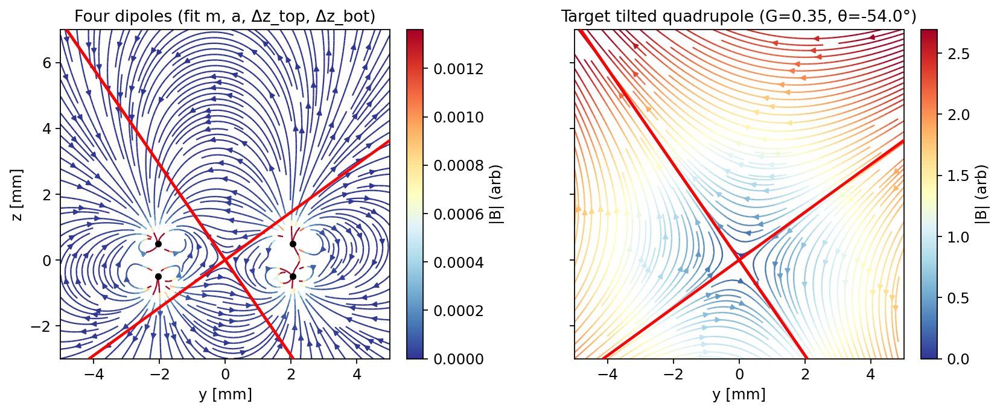

In [102]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import least_squares

# ================== utilities ==================
mm_to_m = 1e-3
scale   = 1e7  # numeric scaling so dipole fields are comparable to target units

def dipole_B(r, r0, m, eps=1e-12):
    """Point-dipole field at r from dipole (r0,m). r: (...,3)."""
    R  = r - r0
    R2 = np.sum(R*R, axis=-1) + eps
    Rn = np.sqrt(R2)
    Rhat = R / Rn[..., None]
    R3 = R2 * Rn
    return (3.0*np.sum(Rhat*m, axis=-1)[...,None]*Rhat - m) / R3[...,None]

def target_field_yz(y, z, G=0.35, theta_deg=-54.0):
    """Tilted quadrupole in the YZ plane (x=0): returns (By, Bz)."""
    th = np.deg2rad(theta_deg); c, s = np.cos(th), np.sin(th)
    Q = np.array([[c*c - s*s, 2*c*s],
                  [2*c*s,     s*s - c*c]])
    YZ = np.stack([y, z], axis=0).reshape(2, -1)
    B  = (G * (Q @ YZ)).reshape(2, *y.shape)
    return B[0], B[1]

# ================== fitter (4 dipoles) ==================
def fit_four_dipoles_yz(G=0.35, theta_deg=-54.0,
                        Ny=31, Nz=31, roi_half_mm=2.5,
                        a0_mm=2.0, dz_top0_mm=1.0, dz_bot0_mm=1.0,
                        a_bounds_mm=(0.5, 8.0),
                        dz_bounds_mm=(-5.0, 5.0),
                        center_weight=True):
    """
    Two PCBs at y=±a, each carrying two dipoles at z=±Δz/2.
    Unknowns (antisymmetry across boards):
      m_t1(3), m_t2(3), a(mm), dz_top(mm), dz_bot(mm)
    Moments on -y PCB are -m_t1, -m_t2 (quadrupole-like).
    """
    # sample region
    y = np.linspace(-roi_half_mm, roi_half_mm, Ny)
    z = np.linspace(-roi_half_mm, roi_half_mm, Nz)
    Y, Z = np.meshgrid(y, z, indexing='xy')
    r = np.stack([np.zeros_like(Y), Y, Z], axis=-1).reshape(-1,3)  # x=0 slice
    r[...,1:] *= mm_to_m  # convert y,z -> meters

    By_t, Bz_t = target_field_yz(Y, Z, G=G, theta_deg=theta_deg)
    b = np.concatenate([By_t.ravel(), Bz_t.ravel()])

    # optional center weighting (emphasize match near origin)
    if center_weight:
        rho2 = (Y**2 + Z**2)
        w = 1.0/(1.0 + (rho2 / (0.6*roi_half_mm)**2))
        W = np.concatenate([w.ravel(), w.ravel()])
    else:
        W = 1.0

    # pack/unpack helpers
    def unpack(v):
        m_t1 = v[0:3]
        m_t2 = v[3:6]
        a    = v[6]  * mm_to_m
        dzT  = v[7]  * mm_to_m
        dzB  = v[8]  * mm_to_m
        return m_t1, m_t2, a, dzT, dzB

    def residual(v):
        m_t1, m_t2, a, dzT, dzB = unpack(v)
        # top PCB (y=+a): z=±dzT/2
        r_t1 = np.array([0.0, +a, +0.5*dzT])
        r_t2 = np.array([0.0, +a, -0.5*dzT])
        # bottom PCB (y=-a): z=±dzB/2, moments antisymmetric
        r_b1 = np.array([0.0, -a, +0.5*dzB])
        r_b2 = np.array([0.0, -a, -0.5*dzB])

        B_t1 = scale*dipole_B(r, r_t1, m_t1)
        B_t2 = scale*dipole_B(r, r_t2, m_t2)
        B_b1 = scale*dipole_B(r, r_b1, -m_t1)
        B_b2 = scale*dipole_B(r, r_b2, -m_t2)
        By = (B_t1[:,1] + B_t2[:,1] + B_b1[:,1] + B_b2[:,1])
        Bz = (B_t1[:,2] + B_t2[:,2] + B_b1[:,2] + B_b2[:,2])
        model = np.concatenate([By, Bz])
        return W*(model - b)

    # initial guess and bounds (in mm for a,dz; moments free)
    x0 = np.array([
        0.0,  0.7,  1.0,   # m_t1
        0.0, -0.7, -1.0,   # m_t2
        a0_mm,             # a
        dz_top0_mm,        # Δz_top
        dz_bot0_mm,        # Δz_bot
    ], dtype=float)

    lb = np.array([-np.inf]*6 + [a_bounds_mm[0], dz_bounds_mm[0], dz_bounds_mm[0]])
    ub = np.array([ np.inf]*6 + [a_bounds_mm[1], dz_bounds_mm[1], dz_bounds_mm[1]])

    res = least_squares(residual, x0, bounds=(lb,ub),
                        xtol=1e-10, ftol=1e-10, gtol=1e-10, max_nfev=600, verbose=0)
    return res, (Y, Z), (By_t, Bz_t)

# ================== run & visualize ==================
G = 0.35
theta = -54.0
res, (Y, Z), (By_t, Bz_t) = fit_four_dipoles_yz(G=G, theta_deg=theta,
                                                Ny=31, Nz=31, roi_half_mm=2.5,
                                                a0_mm=2.0, dz_top0_mm=1.0, dz_bot0_mm=1.0,
                                                a_bounds_mm=(0.5, 8.0),
                                                dz_bounds_mm=(-5.0, 5.0),
                                                center_weight=True)

v = res.x
m_t1 = v[0:3]; m_t2 = v[3:6]; a_mm = v[6]; dzT_mm = v[7]; dzB_mm = v[8]
a = a_mm*mm_to_m; dzT = dzT_mm*mm_to_m; dzB = dzB_mm*mm_to_m

print(f"Top PCB moments:  m_t1={m_t1},  m_t2={m_t2}")
print(f"Bottom PCB moments (antisym): -m_t1, -m_t2")
print(f"a = {a_mm:.3f} mm,   Δz_top = {dzT_mm:.3f} mm,   Δz_bot = {dzB_mm:.3f} mm")

# dense display grid
yy = np.linspace(-5, 5, 201)
zz = np.linspace(-3, 7, 201)
YY, ZZ = np.meshgrid(yy, zz, indexing='xy')
r_disp = np.stack([np.zeros_like(YY), YY*mm_to_m, ZZ*mm_to_m], axis=-1)

# positions of the 4 dipoles
r_t1 = np.array([0.0, +a, +0.5*dzT]); r_t2 = np.array([0.0, +a, -0.5*dzT])
r_b1 = np.array([0.0, -a, +0.5*dzB]); r_b2 = np.array([0.0, -a, -0.5*dzB])

B_t1 = scale*dipole_B(r_disp, r_t1,  m_t1)
B_t2 = scale*dipole_B(r_disp, r_t2,  m_t2)
B_b1 = scale*dipole_B(r_disp, r_b1, -m_t1)
B_b2 = scale*dipole_B(r_disp, r_b2, -m_t2)

By = B_t1[...,1] + B_t2[...,1] + B_b1[...,1] + B_b2[...,1]
Bz = B_t1[...,2] + B_t2[...,2] + B_b1[...,2] + B_b2[...,2]
Bmag = np.hypot(By, Bz)

ByT, BzT = target_field_yz(YY, ZZ, G=G, theta_deg=theta)
BmagT = np.hypot(ByT, BzT)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4.4), sharey=True)

n1 = plt.Normalize(0, np.percentile(Bmag, 98))
sp1 = ax1.streamplot(yy, zz, By, Bz, color=Bmag, cmap='RdYlBu_r',
                     norm=n1, density=2.0, linewidth=1.05, arrowsize=0.8)
cb1 = fig.colorbar(sp1.lines, ax=ax1, fraction=0.046, pad=0.04); cb1.set_label("|B| (arb)")
ax1.plot([ r_t1[1]/mm_to_m, r_t2[1]/mm_to_m, r_b1[1]/mm_to_m, r_b2[1]/mm_to_m],
         [ r_t1[2]/mm_to_m, r_t2[2]/mm_to_m, r_b1[2]/mm_to_m, r_b2[2]/mm_to_m],
         'ko', ms=4)
ax1.set_title("Four dipoles (fit m, a, Δz_top, Δz_bot)")
ax1.set_xlabel("y [mm]"); ax1.set_ylabel("z [mm]"); ax1.set_aspect('equal')

# === overlay all beams (no labels, red) ===
# beam_list = beams_for_visualize or similar
# beam_world_poly(b) should return Nx3 world coordinates (m)
# Pmid, u_hat, z_hat are the same definitions as in your beam-plane plotting code
for b in beam_list:
    Pk = beam_world_poly(b)
    U_beam = (Pk - Pmid) @ u_hat / mm_to_m
    Z_beam = (Pk - Pmid) @ z_hat / mm_to_m
    for ax in (ax1, ax2):
        ax1.plot(U_beam, Z_beam, color="red", lw=2, alpha=0.9, zorder=10)
        ax1.scatter(U_beam, Z_beam, color="red", s=10, alpha=0.8, zorder=11)

n2 = plt.Normalize(0, np.percentile(BmagT, 98))
sp2 = ax2.streamplot(yy, zz, ByT, BzT, color=BmagT, cmap='RdYlBu_r',
                     norm=n2, density=2.0, linewidth=1.05, arrowsize=0.8)
cb2 = fig.colorbar(sp2.lines, ax=ax2, fraction=0.046, pad=0.04); cb2.set_label("|B| (arb)")
ax2.set_title(f"Target tilted quadrupole (G={G}, θ={theta}°)")
ax2.set_xlabel("y [mm]"); ax2.set_aspect('equal')

for b in beam_list:
    Pk = beam_world_poly(b)
    U_beam = (Pk - Pmid) @ u_hat / mm_to_m
    Z_beam = (Pk - Pmid) @ z_hat / mm_to_m
    for ax in (ax1, ax2):
        ax2.plot(U_beam, Z_beam, color="red", lw=2, alpha=0.9, zorder=10)
        ax2.scatter(U_beam, Z_beam, color="red", s=10, alpha=0.8, zorder=11)


ax1.set_xlim(yy[0], yy[-1])
ax1.set_ylim(zz[0], zz[-1])
ax2.set_xlim(yy[0], yy[-1])
ax2.set_ylim(zz[0], zz[-1])

plt.tight_layout(); plt.show()

In [103]:
# --- add this new argument ---
def fit_four_dipoles_yz(G=0.35, theta_deg=-54.0,
                        Ny=31, Nz=31, roi_half_mm=2.5,
                        a0_mm=2.0, dz_top0_mm=1.0, dz_bot0_mm=1.0,
                        a_bounds_mm=(0.5, 8.0),
                        dz_bounds_mm=(-5.0, 5.0),
                        z_shift_mm=3.0,          # <<--- NEW: push zero up by +3 mm
                        center_weight=True, pin_zero=True):

    mm_to_m = 1e-3
    scale   = 1e7

    # sample region in *mm*
    y = np.linspace(-roi_half_mm, roi_half_mm, Ny)
    z = np.linspace(-roi_half_mm, roi_half_mm, Nz)
    Y, Z = np.meshgrid(y, z, indexing='xy')

    # evaluate target at (y, z - z_shift)
    def target_field_yz(y_mm, z_mm, G=1.0, theta_deg=0.0):
        th = np.deg2rad(theta_deg); c, s = np.cos(th), np.sin(th)
        Q = np.array([[c*c - s*s, 2*c*s],
                      [2*c*s,     s*s - c*c]])
        YZ = np.stack([y_mm, z_mm], axis=0).reshape(2, -1)
        B  = (G * (Q @ YZ)).reshape(2, *y_mm.shape)
        return B[0], B[1]

    By_t, Bz_t = target_field_yz(Y, Z - z_shift_mm, G=G, theta_deg=theta_deg)
    b = np.concatenate([By_t.ravel(), Bz_t.ravel()])

    # build evaluation points in meters for dipoles
    r = np.stack([np.zeros_like(Y), Y*mm_to_m, Z*mm_to_m], axis=-1).reshape(-1,3)

    # center weighting (favor matching near the *shifted* center)
    if center_weight:
        rho2 = (Y**2 + (Z - z_shift_mm)**2)
        w = 1.0/(1.0 + (rho2/(0.6*roi_half_mm)**2))
        W = np.concatenate([w.ravel(), w.ravel()])
    else:
        W = 1.0

    # optional single-point "pin" to enforce the null exactly at (0, z_shift)
    # adds a couple of residuals with a high weight
    if pin_zero:
        pin_pts_m = np.array([[0.0, 0.0, z_shift_mm*mm_to_m]])  # (x,y,z) in m
        pin_w = 15.0  # strength of pin
    else:
        pin_pts_m = None

    def dipole_B(r, r0, m, eps=1e-12):
        R  = r - r0
        R2 = np.sum(R*R, axis=-1) + eps
        Rn = np.sqrt(R2)
        Rhat = R / Rn[..., None]
        R3 = R2 * Rn
        return (3.0*np.sum(Rhat*m, axis=-1)[...,None]*Rhat - m) / R3[...,None]

    # pack/unpack, antisymmetry across boards
    def unpack(v):
        m_t1 = v[0:3]; m_t2 = v[3:6]
        a    = v[6]*mm_to_m
        dzT  = v[7]*mm_to_m
        dzB  = v[8]*mm_to_m
        return m_t1, m_t2, a, dzT, dzB

    def residual(v):
        m_t1, m_t2, a, dzT, dzB = unpack(v)
        r_t1 = np.array([0.0, +a, +0.5*dzT]); r_t2 = np.array([0.0, +a, -0.5*dzT])
        r_b1 = np.array([0.0, -a, +0.5*dzB]); r_b2 = np.array([0.0, -a, -0.5*dzB])

        B_t1 = scale*dipole_B(r, r_t1,  m_t1)
        B_t2 = scale*dipole_B(r, r_t2,  m_t2)
        B_b1 = scale*dipole_B(r, r_b1, -m_t1)
        B_b2 = scale*dipole_B(r, r_b2, -m_t2)

        By = B_t1[:,1] + B_t2[:,1] + B_b1[:,1] + B_b2[:,1]
        Bz = B_t1[:,2] + B_t2[:,2] + B_b1[:,2] + B_b2[:,2]
        res_main = W*(np.concatenate([By, Bz]) - b)

        if pin_pts_m is None:
            return res_main
        # enforce ~zero at (0, z_shift)
        Bt_pin = ( scale*dipole_B(pin_pts_m, r_t1,  m_t1)
                 + scale*dipole_B(pin_pts_m, r_t2,  m_t2)
                 + scale*dipole_B(pin_pts_m, r_b1, -m_t1)
                 + scale*dipole_B(pin_pts_m, r_b2, -m_t2) )[0]
        res_pin = pin_w * np.array([Bt_pin[1], Bt_pin[2]])  # By,Bz ~ 0 there
        return np.concatenate([res_main, res_pin])

    # initial guess & bounds
    x0 = np.array([0.0, 0.7, 1.0,  0.0,-0.7,-1.0,  2.0, 1.0, 1.0], dtype=float)
    lb = np.array([-np.inf]*6 + [a_bounds_mm[0], dz_bounds_mm[0], dz_bounds_mm[0]])
    ub = np.array([ np.inf]*6 + [a_bounds_mm[1], dz_bounds_mm[1], dz_bounds_mm[1]])

    from scipy.optimize import least_squares
    res = least_squares(residual, x0, bounds=(lb,ub),
                        xtol=1e-10, ftol=1e-10, gtol=1e-10, max_nfev=600)
    return res, (Y, Z, z_shift_mm)

Top PCB moments:  m_t1=[ 0.00000000e+00  7.14807337e-20 -1.62957284e-19],  m_t2=[ 2.02435988e+01  8.28109896e-20 -1.62684443e-19]
Bottom PCB moments (antisym): -m_t1, -m_t2
a = 2.003 mm,   Δz_top = 1.012 mm,   Δz_bot = 0.982 mm


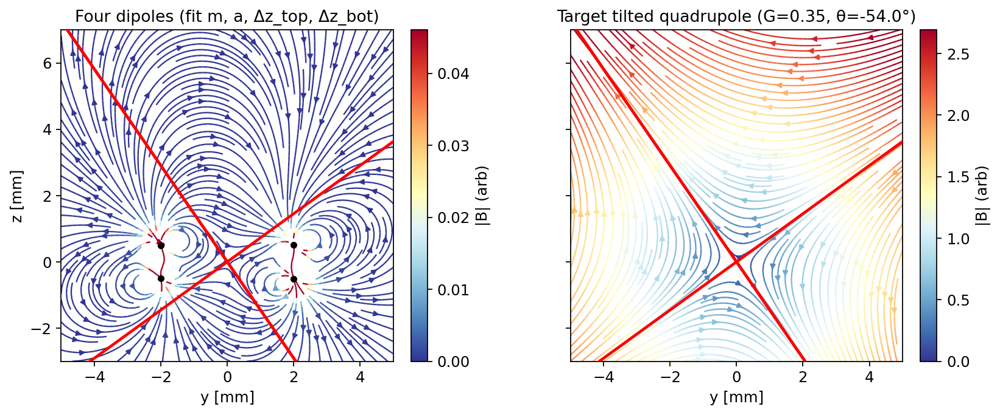

In [108]:
# ================== run & visualize ==================
G = 0.35
theta = -54.0
res, (Y, Z, z_shift_mm) = fit_four_dipoles_yz(G=G, theta_deg=theta,
                                                Ny=31, Nz=31, roi_half_mm=5,
                                                a0_mm=2.0, dz_top0_mm=1.0, dz_bot0_mm=1.0,
                                                a_bounds_mm=(0.5, 8.0),
                                                dz_bounds_mm=(-10.0, 10.0),
                                                z_shift_mm=5.0,
                                                center_weight=True)

v = res.x
m_t1 = v[0:3]; m_t2 = v[3:6]; a_mm = v[6]; dzT_mm = v[7]; dzB_mm = v[8]
a = a_mm*mm_to_m; dzT = dzT_mm*mm_to_m; dzB = dzB_mm*mm_to_m

print(f"Top PCB moments:  m_t1={m_t1},  m_t2={m_t2}")
print(f"Bottom PCB moments (antisym): -m_t1, -m_t2")
print(f"a = {a_mm:.3f} mm,   Δz_top = {dzT_mm:.3f} mm,   Δz_bot = {dzB_mm:.3f} mm")

# dense display grid
yy = np.linspace(-5, 5, 201)
zz = np.linspace(-3, 7, 201)
YY, ZZ = np.meshgrid(yy, zz, indexing='xy')
r_disp = np.stack([np.zeros_like(YY), YY*mm_to_m, ZZ*mm_to_m], axis=-1)

# positions of the 4 dipoles
r_t1 = np.array([0.0, +a, +0.5*dzT]); r_t2 = np.array([0.0, +a, -0.5*dzT])
r_b1 = np.array([0.0, -a, +0.5*dzB]); r_b2 = np.array([0.0, -a, -0.5*dzB])

B_t1 = scale*dipole_B(r_disp, r_t1,  m_t1)
B_t2 = scale*dipole_B(r_disp, r_t2,  m_t2)
B_b1 = scale*dipole_B(r_disp, r_b1, -m_t1)
B_b2 = scale*dipole_B(r_disp, r_b2, -m_t2)

By = B_t1[...,1] + B_t2[...,1] + B_b1[...,1] + B_b2[...,1]
Bz = B_t1[...,2] + B_t2[...,2] + B_b1[...,2] + B_b2[...,2]
Bmag = np.hypot(By, Bz)

ByT, BzT = target_field_yz(YY, ZZ, G=G, theta_deg=theta)
BmagT = np.hypot(ByT, BzT)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4.4), sharey=True)

n1 = plt.Normalize(0, np.percentile(Bmag, 98))
sp1 = ax1.streamplot(yy, zz, By, Bz, color=Bmag, cmap='RdYlBu_r',
                     norm=n1, density=2.0, linewidth=1.05, arrowsize=0.8)
cb1 = fig.colorbar(sp1.lines, ax=ax1, fraction=0.046, pad=0.04); cb1.set_label("|B| (arb)")
ax1.plot([ r_t1[1]/mm_to_m, r_t2[1]/mm_to_m, r_b1[1]/mm_to_m, r_b2[1]/mm_to_m],
         [ r_t1[2]/mm_to_m, r_t2[2]/mm_to_m, r_b1[2]/mm_to_m, r_b2[2]/mm_to_m],
         'ko', ms=4)
ax1.set_title("Four dipoles (fit m, a, Δz_top, Δz_bot)")
ax1.set_xlabel("y [mm]"); ax1.set_ylabel("z [mm]"); ax1.set_aspect('equal')

# === overlay all beams (no labels, red) ===
# beam_list = beams_for_visualize or similar
# beam_world_poly(b) should return Nx3 world coordinates (m)
# Pmid, u_hat, z_hat are the same definitions as in your beam-plane plotting code
for b in beam_list:
    Pk = beam_world_poly(b)
    U_beam = (Pk - Pmid) @ u_hat / mm_to_m
    Z_beam = (Pk - Pmid) @ z_hat / mm_to_m
    for ax in (ax1, ax2):
        ax1.plot(U_beam, Z_beam, color="red", lw=2, alpha=0.9, zorder=10)
        ax1.scatter(U_beam, Z_beam, color="red", s=10, alpha=0.8, zorder=11)

n2 = plt.Normalize(0, np.percentile(BmagT, 98))
sp2 = ax2.streamplot(yy, zz, ByT, BzT, color=BmagT, cmap='RdYlBu_r',
                     norm=n2, density=2.0, linewidth=1.05, arrowsize=0.8)
cb2 = fig.colorbar(sp2.lines, ax=ax2, fraction=0.046, pad=0.04); cb2.set_label("|B| (arb)")
ax2.set_title(f"Target tilted quadrupole (G={G}, θ={theta}°)")
ax2.set_xlabel("y [mm]"); ax2.set_aspect('equal')

for b in beam_list:
    Pk = beam_world_poly(b)
    U_beam = (Pk - Pmid) @ u_hat / mm_to_m
    Z_beam = (Pk - Pmid) @ z_hat / mm_to_m
    for ax in (ax1, ax2):
        ax2.plot(U_beam, Z_beam, color="red", lw=2, alpha=0.9, zorder=10)
        ax2.scatter(U_beam, Z_beam, color="red", s=10, alpha=0.8, zorder=11)


ax1.set_xlim(yy[0], yy[-1])
ax1.set_ylim(zz[0], zz[-1])
ax2.set_xlim(yy[0], yy[-1])
ax2.set_ylim(zz[0], zz[-1])

plt.tight_layout(); plt.show()